In [1]:
import pickle
import numpy as np

def load_pickle_file(dpath):
    with open(dpath, 'rb') as f:
        return pickle.load(f)

dpath = '/home/miguel/Projects/uni/phd/smlm_z/smlm-z/data/05_model_input/'

training_X = load_pickle_file(dpath + 'X.pk')

psfs = training_X[0].sum(axis=-1)[:, :, :, np.newaxis]
coords = training_X[1]
y = load_pickle_file(dpath + 'y.pk')

def chunk_data(psfs, coords, y, data_splits=None):
    idx = np.argwhere(np.diff(y.squeeze())<0).squeeze()
    idx += 1
    idx = np.concatenate([[0], idx, [len(y)]])
    all_psfs = []
    all_coords = []
    ys = []
    if data_splits is not None:
        splits = []
    for i in range(0, len(idx)-1):
        s = idx[i]
        end = idx[i+1]
        all_psfs.append(psfs[s:end])
        all_coords.append(coords[s:end])
        ys.append(y[s:end])
        if data_splits is not None:
            splits.append(data_splits[i])

    if data_splits is not None:
        return Xs, ys, splits
    return np.stack(all_psfs), np.stack(all_coords), np.stack(ys)

psfs = psfs.astype(np.uint16)
psfs, coords, ys = chunk_data(psfs, coords, y)
print(psfs.shape)
print(coords.shape)
print(ys.shape)

import pickle
with open('./psfs.pk', 'wb') as f:
    pickle.dump(psfs, f)

import pickle
with open('./coords.pk', 'wb') as f:
    pickle.dump(coords, f)

(167, 99, 32, 32, 1)
(167, 99, 2)
(167, 99, 1)


In [2]:
# import sys
# sys.path.append('/home/miguel/Projects/uni/phd/smlm_z/smlm-z/src/smlm_z/pipelines/')
# from preprocessing import align_psfs
# import pandas as pd

# align_psfs.DEBUG = True

# df = pd.DataFrame(coords[:, 0, :], columns=['x', 'y'])
# offsets = align_psfs.classic_align_psfs(psfs.squeeze(), df)

offsets = [0] * psfs.shape[0]

In [3]:
print(offsets)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


Train


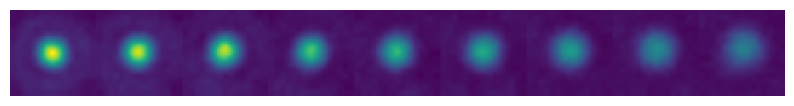

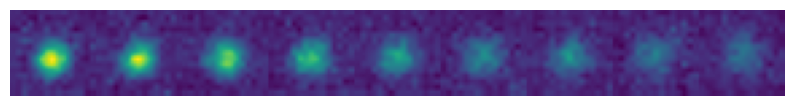

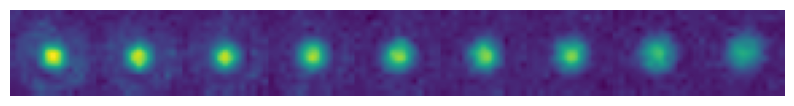

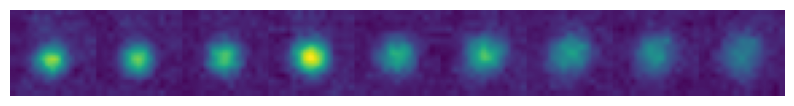

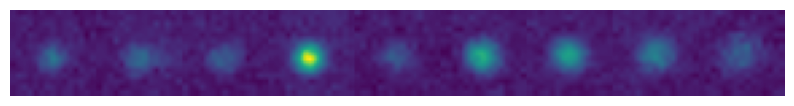

...

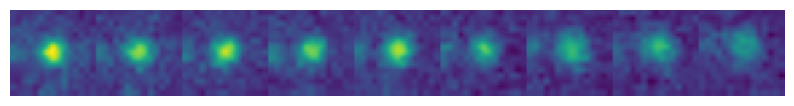

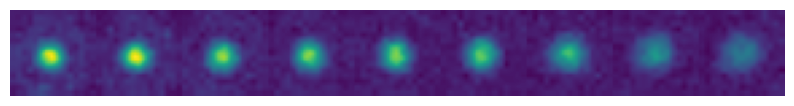

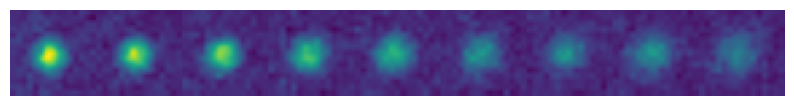

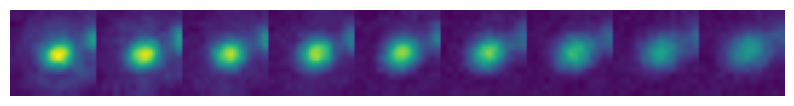

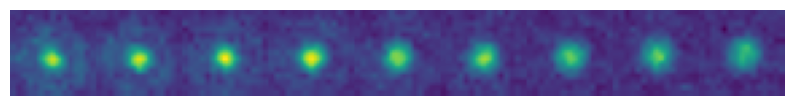

Val


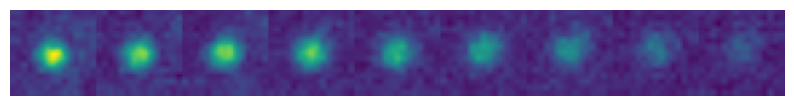

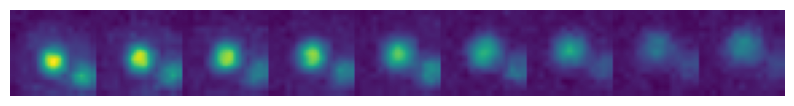

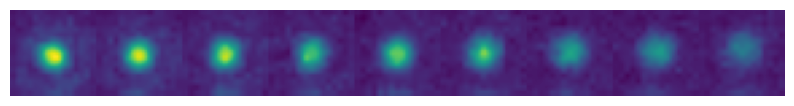

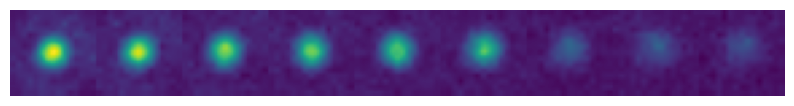

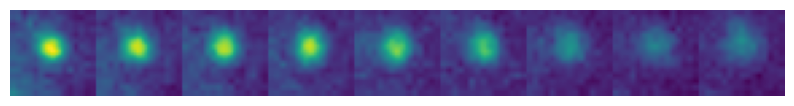

...

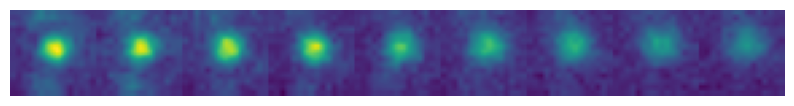

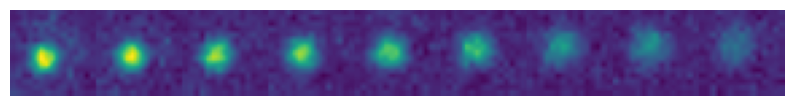

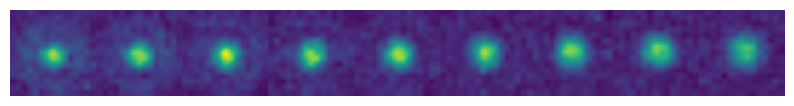

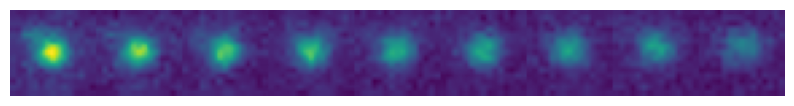

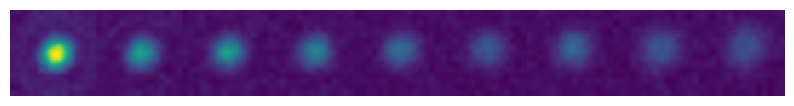

Test


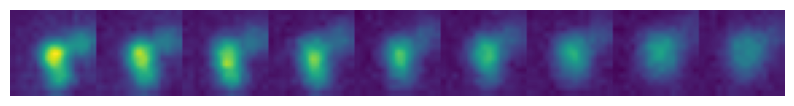

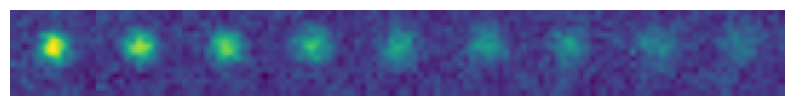

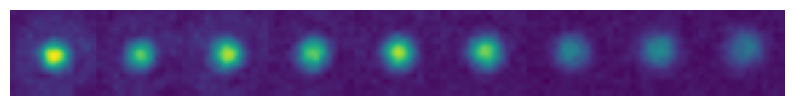

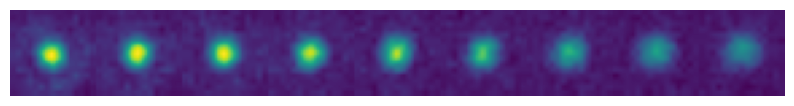

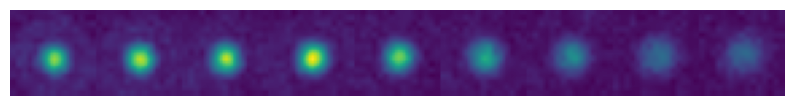

...

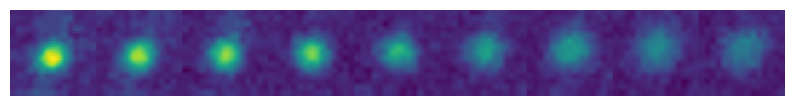

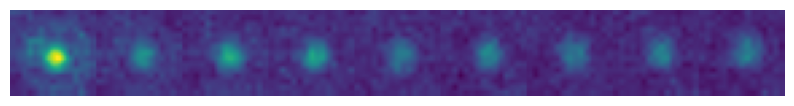

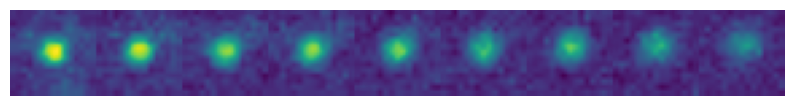

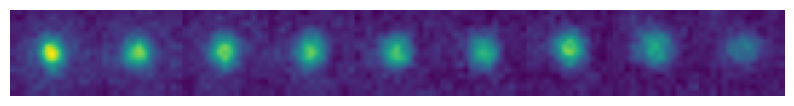

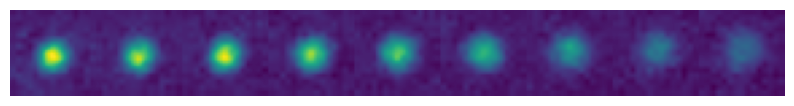

In [4]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
SEED = 42
train_size = 0.8

test_size = 0.5

idx = list(range(0, psfs.shape[0]))

train_idx, other_idx = train_test_split(idx, train_size=train_size, random_state=SEED, shuffle=True)
val_idx, test_idx = train_test_split(other_idx, test_size=test_size, random_state=SEED, shuffle=True)

X_train = psfs[train_idx], coords[train_idx]
y_train = ys[train_idx]

X_val = psfs[val_idx], coords[val_idx]
y_val = ys[val_idx]

X_test = psfs[test_idx], coords[test_idx]
y_test = ys[test_idx]



from data.visualise import grid_psfs, show_psf_axial
import seaborn as sns

# sns.scatterplot(data=locs, x='x', y='y')
# plt.show()
plt.rcParams['figure.figsize'] = [10, 10]
print('Train')
for psf in X_train[0]:
    show_psf_axial(psf.sum(axis=-1))
    
print('Val')
for psf in X_val[0]:
    show_psf_axial(psf.sum(axis=-1))
    
    
print('Test')
for psf in X_test[0]:
    show_psf_axial(psf.sum(axis=-1))
    

In [5]:
print(X_train[0].shape, X_train[1].shape)
print(X_val[0].shape, X_val[1].shape)
print(X_test[0].shape, X_test[1].shape)

(133, 99, 32, 32, 1) (133, 99, 2)
(17, 99, 32, 32, 1) (17, 99, 2)
(17, 99, 32, 32, 1) (17, 99, 2)


In [6]:
# # Augmentation
# from tqdm import tqdm

# DEBUG = False
# dtype = X_train[0].dtype

# max_val = np.iinfo(X_train[0].dtype).max

# aug_percentage = 2

# def noise_psf(psf, baseline, qe, dn, bitdepth=8):
#     psf = (psf * (2**bitdepth)).astype(int)
#     photons = np.random.poisson(psf)
#     electrons = np.round(photons * qe)
#     electrons_out = electrons + np.random.normal(scale=dn, size=psf.shape)
#     noisy_psf = electrons_out + baseline
    
#     if DEBUG:
#         show_psf_axial(photons.sum(axis=-1), 'photons')
#         show_psf_axial(electrons.sum(axis=-1), 'electons')
#         show_psf_axial(electrons_out.sum(axis=-1), 'electons out')
#         show_psf_axial(noisy_psf.sum(axis=-1), 'noisy')
#         show_psf_axial(psf.sum(axis=-1), 'original')
    
#     return noisy_psf

# def augment_psf(psf):
#     baseline = np.random.uniform(0.001, 0.25) * psf.max()
#     qe = np.random.uniform(0.85, 0.95)
#     dn = np.random.uniform(0, 0.03) * psf.max()
#     bitdepth = 16
#     psf = psf.astype(float) / max_val
#     return noise_psf(psf, baseline, qe, dn, bitdepth)
    
    
    
# n_aug = X_train[0].shape[0] * aug_percentage
# idx = list(range(X_train[0].shape[0]))
# idx = np.random.choice(idx, n_aug)

# aug_psfs = []
# aug_coords = []
# aug_y = []

# for i in tqdm(idx):
#     psf = X_train[0][i]
#     coords = X_train[1][i]
    
#     y = y_train[i]
    
#     psf = augment_psf(psf)
    
#     aug_psfs.append(psf)
#     aug_coords.append(coords)
#     aug_y.append(y)
    

# aug_psfs = np.stack(aug_psfs)
# aug_coords = np.stack(aug_coords)
# aug_y = np.stack(aug_y)


# data = {
#     'train': X_train[0].flatten(),
#     'aug': aug_psfs.flatten(),
#     'val': X_val[0].flatten(),
#     'test': X_test[0].flatten()
# }
# data = {k: np.random.choice(v, 10000) for k, v in data.items()}
# import seaborn as sns

# plt.rcParams['figure.figsize'] = [10, 3]
# sns.histplot(data, stat='probability', common_norm=False)
# plt.show()

# X_train_aug = np.concatenate((X_train[0], aug_psfs)), np.concatenate((X_train[1], aug_coords))
# y_train_aug = np.concatenate((y_train, aug_y))
# print(X_train_aug[0].shape, X_train_aug[1].shape)
# print(y_train_aug.shape)


In [7]:
import numpy as np
X_train = list(X_train)
X_val = list(X_val)
X_test = list(X_test)
for i in range(2):
    X_train[i] = np.concatenate(X_train[i]).astype(float)
    X_val[i] = np.concatenate(X_val[i]).astype(float)
    X_test[i] = np.concatenate(X_test[i]).astype(float)

y_train = np.concatenate(y_train).astype(float)

# y_train_aug = np.concatenate(y_train_aug).astype(float)
y_val = np.concatenate(y_val).astype(float)
y_test = np.concatenate(y_test).astype(float)

print(X_train[0].shape, X_train[1])
print(X_val[0].shape, X_val[1])
print(X_test[0].shape, X_test[1])


# print(y_train_aug.shape)
print(y_val.shape)
print(y_test.shape)

(13167, 32, 32, 1) [[ 0.51132417  0.64235294]
 [ 0.51132417  0.64235294]
 [ 0.51132417  0.64235294]
 ...
 [ 0.5389352  -0.07196701]
 [ 0.5389352  -0.07196701]
 [ 0.5389352  -0.07196701]]
(1683, 32, 32, 1) [[-0.38753572  0.15329772]
 [-0.38753572  0.15329772]
 [-0.38753572  0.15329772]
 ...
 [ 0.4797117   0.9311421 ]
 [ 0.4797117   0.9311421 ]
 [ 0.4797117   0.9311421 ]]
(1683, 32, 32, 1) [[-0.00889295  0.6308819 ]
 [-0.00889295  0.6308819 ]
 [-0.00889295  0.6308819 ]
 ...
 [ 0.29293305  0.84790254]
 [ 0.29293305  0.84790254]
 [ 0.29293305  0.84790254]]
(1683, 1)
(1683, 1)


In [8]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler().fit(X_train[1])
X_train[1] = scaler.transform(X_train[1])
X_val[1] = scaler.transform(X_val[1])
X_test[1] = scaler.transform(X_test[1])

In [9]:
# from skimage.transform import rescale
# plt.rcParams['figure.figsize'] = [3, 3]
# def bin_pixels(img):
#     subsample_ratio = 2
#     new_shape = [s//subsample_ratio for s in img.shape[0:2]] + [1]
#     new_img = rescale(img, 1/subsample_ratio, anti_aliasing=False)
    
#     upscaled_img = rescale(new_img, (subsample_ratio, subsample_ratio, 1), anti_aliasing=False, order=0)
# #     plt.imshow(img)
# #     plt.show()
# #     plt.imshow(new_img)
# #     plt.title(new_img.shape)
# #     plt.show()
    
# #     plt.imshow(upscaled_img)
# #     plt.title(upscaled_img.shape)
# #     plt.show()
#     return upscaled_img

# plt.imshow(X_train[0])
# plt.show()
# X_train = np.stack([bin_pixels(img) for img in X_train])
# X_val = np.stack([bin_pixels(img) for img in X_val])
# X_test = np.stack([bin_pixels(img) for img in X_test])
# plt.imshow(X_train[0])
# plt.show()

In [10]:
from skimage.transform import resize

X_train[0] = np.stack([resize(psf, (128, 128, 3)) for psf in X_train[0]])
X_val[0] = np.stack([resize(psf, (128, 128, 3)) for psf in X_val[0]])
X_test[0] = np.stack([resize(psf, (128, 128, 3)) for psf in X_test[0]])

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers, Sequential
from tensorflow.keras import optimizers
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tqdm.keras import TqdmCallback
from tensorflow.keras import regularizers

import tensorflow as tf

from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rescale=1.0/65336.0,
    samplewise_center=False,
    samplewise_std_normalization=False,
    featurewise_center=True,
    featurewise_std_normalization=True,
    horizontal_flip=False)

# compute quantities required for featurewise normalization
# (std, mean, and principal components if ZCA whitening is applied)
datagen.fit(X_train[0])

X_train[0] = datagen.standardize(X_train[0])
X_val[0] = datagen.standardize(X_val[0])
X_test[0] = datagen.standardize(X_test[0])

img_input = layers.Input((X_train[0][0].shape))
coords_input = layers.Input(X_train[1][0].shape)

x = img_input
x = Sequential([
    layers.GaussianNoise(stddev=1e-2, seed=42),
#     layers.RandomTranslation(5/224, 5/224, seed=42),
    layers.RandomBrightness(0.01, [X_train[0].min(), X_train[0].max()], seed=42)
])(x)


x = keras.applications.MobileNet(
    input_tensor=img_input,
    include_top=False,
    weights='./mobilenet_1_0_128_tf_no_top.h5',
    pooling='avg',
#     include_preprocessing=False
)(x)

x = tf.concat([x, coords_input], axis=-1)

out = layers.Dense(1, activation="linear",
                   kernel_regularizer=regularizers.L1L2(l1=1e-5, l2=1e-4),
                   bias_regularizer=regularizers.L2(1e-4),
                   activity_regularizer=regularizers.L2(1e-5)
                  )(x)

model = keras.Model(inputs=(img_input, coords_input), outputs=out)

model.summary(expand_nested=False)
    

batch_size = 32
epochs = 5000
lr = 0.0001

model.compile(loss='mean_squared_error', optimizer=optimizers.Adam(learning_rate=lr), metrics=['mean_absolute_error'])

callbacks = [
    ReduceLROnPlateau(monitor='val_mean_absolute_error', factor=0.1,
                      patience=25, verbose=True, mode='min', min_delta=0.0001, min_lr=1e-6,),
    EarlyStopping(monitor='val_mean_absolute_error', patience=150,
                  verbose=False, min_delta=1, restore_best_weights=True),
    TqdmCallback(verbose=1),
]
    

history = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, validation_data=(X_val, y_val), callbacks=callbacks, shuffle=True, verbose=False)

# With smoothing: 7.41, 123
# 59.9, 110
# 51, 109 w/ batchNorm
# 5.5, 103 Removed batchNorm
# 5.65, 115 Increased noise from 1e-4 to 1e-3
# 3.4, 113 Reduced lr to 0.0001
# 14.2, 108 added RandomTranslation
# RandomBrightness


# Changed to box15

# vanilla train 26.215 val 141.125
# gauss aug 1e-3 12.29, 138.401
# gauss aug 1e-2 14.108 129.424
# gauss aug 1e-2 17.932, 131.54
# brightness 0.01 26.205, 142.056

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_25 (InputLayer)          [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential_11 (Sequential)     (None, 128, 128, 3)  0           ['input_25[0][0]']               
                                                                                                  
 mobilenet_1.00_None (Functiona  (None, 1024)        3228864     ['sequential_11[0][0]']          
 l)                                                                                               
                                                                                           


Epoch 54: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.

Epoch 79: ReduceLROnPlateau reducing learning rate to 1e-06.


In [65]:
for k, (X, y) in [('train', (X_train, y_train)), ('val', (X_val, y_val))]:
    res = model.predict(X, verbose=False)
    error = mean_absolute_error(res, y)
    print(k, round(error, 3))

train 63.591
val 147.232


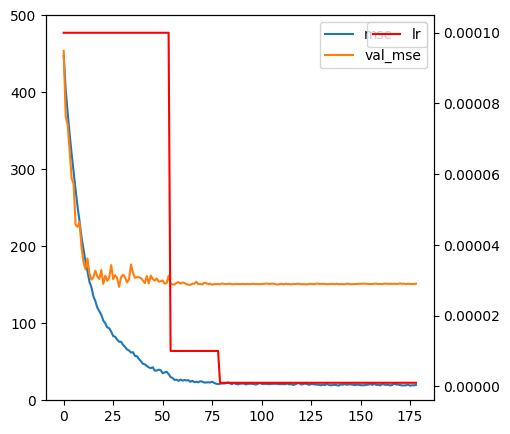

In [66]:
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [5, 5]
fig, ax1 = plt.subplots()
ax1.plot(history.history['mean_absolute_error'], label='mse')
ax1.plot(history.history['val_mean_absolute_error'], label='val_mse')
ax1.set_ylim([0, 500])
ax1.legend(loc=1)
ax2 = ax1.twinx()
ax2.plot(history.history['lr'], label='lr', color='red')
ax2.legend(loc=0)


53/53 [==============================] - 0s 4ms/step


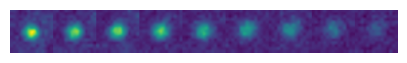

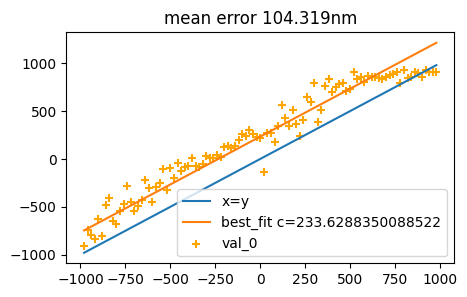

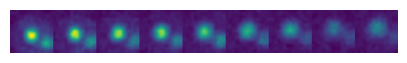

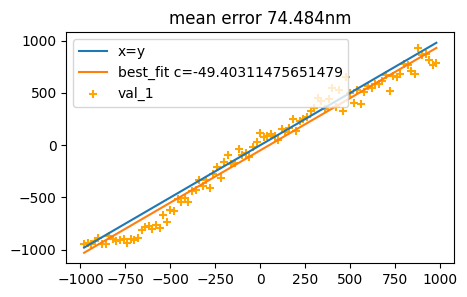

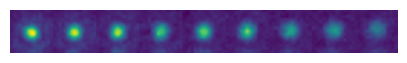

...

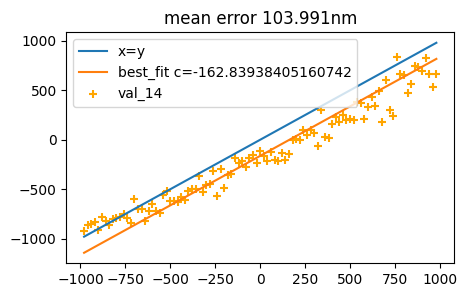

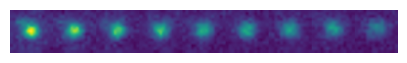

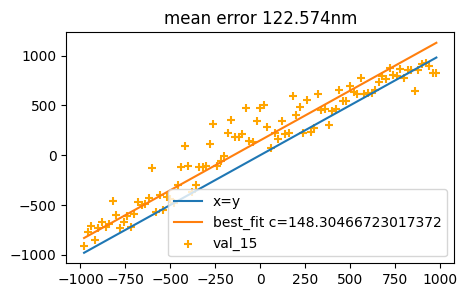

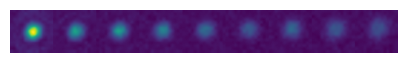

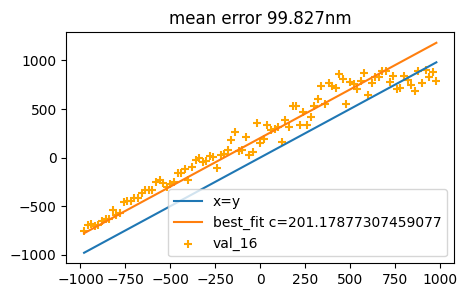

53/53 [==============================] - 0s 6ms/step


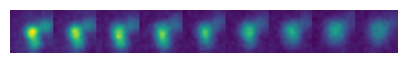

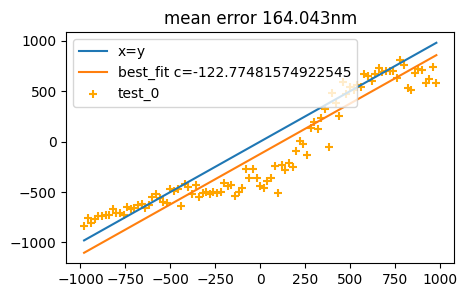

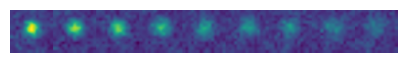

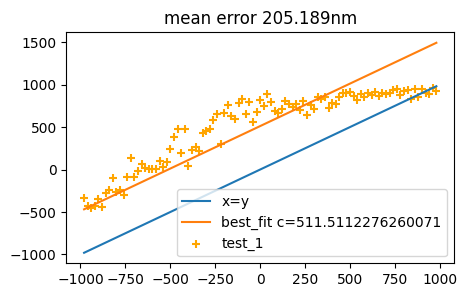

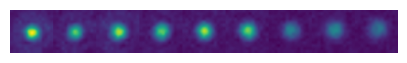

...

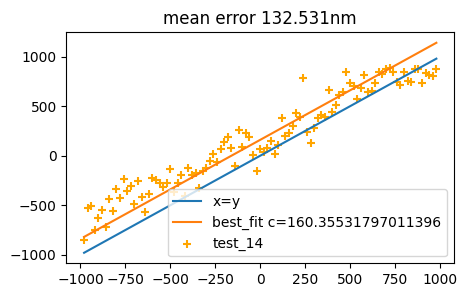

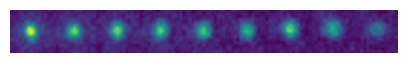

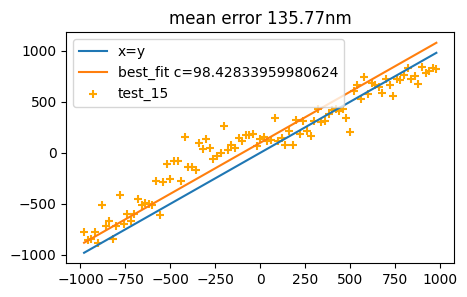

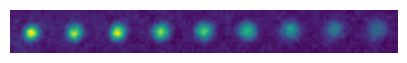

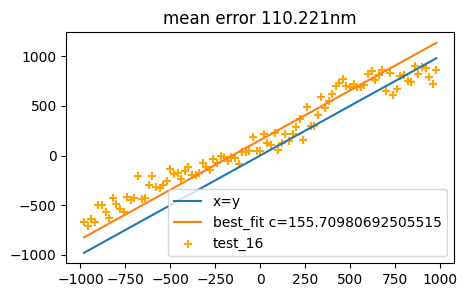

In [48]:
from sklearn.metrics import mean_absolute_error
import scipy.optimize as opt

plt.rcParams['figure.figsize'] = [5, 3]

def bestfit_error(z_true, z_pred):

    def linfit(x, c):
        return x + c

    x = z_true.squeeze()
    y = z_pred.squeeze()
    popt, _ = opt.curve_fit(linfit, x, y, p0=[0])

    x = np.linspace(z_true.min(), z_true.max(), len(y))
    y_fit = linfit(x, popt[0])
    plt.plot(x, x, label=f'x=y')
    plt.plot(x, y_fit, label=f'best_fit c={popt[0]}')

    error = mean_absolute_error(y_fit, y)
    return error



for name, dataset in [
#     ('train', (X_train, y_train)), 
    ('val', (X_val, y_val)), 
    ('test', (X_test, y_test))]:
    inputs, z = dataset
    
    z_pred = model.predict(inputs)
    splits = [0] + list(np.argwhere(np.diff(z.squeeze()) < 0).flatten()+1) + [inputs[0].shape[0]]
    for i in range(len(splits)-1):
    
        start = splits[i]
        end = splits[i+1]
        show_psf_axial(inputs[0][start:end].mean(axis=-1))
        
        pred_zs = z_pred[start:end]
        true_zs = z[start:end]
        error = bestfit_error(true_zs, pred_zs)
#         error = mean_absolute_error(true_zs, pred_zs)
        plt.title(f'mean error {round(error, 3)}nm')
        plt.scatter(true_zs, pred_zs, label=f'{name}_{i}', marker='+', c='orange')
        plt.legend()
        plt.show()

    


In [14]:
import pandas as pd

df = pd.read_csv('/home/miguel/Projects/uni/data/smlm_3d/20230601_MQ_celltype/nup/fov2/storm_1/storm_1_MMStack_Default.ome_locs_40k.csv')

FileNotFoundError: [Errno 2] No such file or directory: '/home/miguel/Projects/uni/data/smlm_3d/20230601_MQ_celltype/nup/fov2/storm_1/storm_1_MMStack_Default.ome_locs_40k.csv'

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.scatterplot(data=df, x='x [nm]', y='y [nm]', alpha=0.05)

xlims = [31000, 33000]
ylims = [24000, 26000]
plt.xlim(*xlims)
plt.ylim(*ylims)
plt.show()

pixel_size = 86
xlim_pixels = [x/pixel_size for x in xlims]
ylim_pixels= [y/pixel_size for y in ylims]

print(xlim_pixels)
print(ylim_pixels)
